In [1]:
import pandas as pd
import numpy as np
from numpy import mean, std, absolute
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, LassoLarsIC, BayesianRidge, PoissonRegressor
import xgboost as xg
import scipy as sp
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score as r2
from sklearn.preprocessing import normalize

plt.style.use('ggplot')

In [2]:
!pip install openpyxl

You should consider upgrading via the 'c:\users\sauga\google drive\packages\research\scripts\python.exe -m pip install --upgrade pip' command.


In [2]:
data = pd.read_excel('Data/Gasification Data_Daya.xlsx', index_col=0, header=0)
data = data.iloc[1:223,:14] 
display(list(data.columns.values))

# Drop null balues and store dataframe in dataframe 2
data=data.dropna()
print(data)

#Check Null values again after removing
print(data.isnull().values.any())
print(data.isna().values.any())

X = data.iloc[:, :9]
y = data.iloc[:, 9:]

input_columns = list(X.columns.values)
input_columns = [i.split(' [', 1)[0] for i in input_columns]
output_columns = list(y.columns.values)
output_columns = [i.split(' [', 1)[0] for i in output_columns]
print(input_columns, output_columns)

Xnorm = normalize(X, 'l2', axis=1)
ynorm = normalize(y, 'l2', axis=1)

print(Xnorm.shape, ynorm.shape)

['C [%wt db]',
 'H [%wt db]',
 'O [%wt db]',
 'Moisture [%wt]',
 'Ash [%wt db]',
 'ER [-]',
 'T [ºC]',
 'Bed material',
 'Steam/Biomass',
 'H2 [%vol N2 free]',
 'CO [%vol N2 free]',
 'CO2 [%vol N2 free]',
 'CH4 [%vol N2 free]',
 'GY [Nm3/kg daf]']

        C [%wt db] H [%wt db]  O [%wt db] Moisture [%wt]  Ash [%wt db]  \
Sr No.                                                                   
2            50.00        5.7       44.10             21          0.85   
3            50.00        5.7       44.10             23          0.85   
4            50.00        5.7       44.10             22          0.85   
5            50.00        5.7       44.10             25          0.85   
6            50.00        5.7       44.10             19          0.85   
...            ...        ...         ...            ...           ...   
219          46.85        6.3       45.55              9          1.30   
220          46.85        6.3       45.55              9          1.30   
221          46.76       5.68       39.46           9.94          8.10   
222          46.76       5.68       39.46           9.94          8.10   
223          46.76       5.68       39.46           9.94          8.10   

        ER [-]  T [ºC]  Bed material 

## Regression Analysis

In [3]:
# constants
methods = ['Linear', 'Ridge', 'LARS', 'RF', 'Bag', 'GradientBoost']
number_of_folds = 11
ridge_reg = [1.0, 10.0, 100.0, 1000.0, 1e6]
n_estimators = [10, 50, 100, 500, 1000]
learning_rate = [1e-3, 0.01, 0.1, 1]
max_depth = 30

methods_extended = []
for met in methods:
    if met == 'Linear' or met == 'LARS':
        methods_extended.append(met)
    elif met == 'Ridge':
        for reg in ridge_reg:
            methods_extended.append(met + '_Reg_' + str(reg))
    elif met == 'RF':
        for rfest in n_estimators:
            methods_extended.append(met + '_est_' + str(rfest))
    elif met == 'Bag':
        for best in n_estimators:
            methods_extended.append(met + '_est_' + str(best))
    elif met == 'GradientBoost':
        for gbest in n_estimators:
            for lr in learning_rate:
                methods_extended.append(met + '_est_' + str(gbest) + 
                                        '_lr_' + str(lr))
print(methods_extended)

['Linear', 'Ridge_Reg_1.0', 'Ridge_Reg_10.0', 'Ridge_Reg_100.0', 'Ridge_Reg_1000.0', 'Ridge_Reg_1000000.0', 'LARS', 'RF_est_10', 'RF_est_50', 'RF_est_100', 'RF_est_500', 'RF_est_1000', 'Bag_est_10', 'Bag_est_50', 'Bag_est_100', 'Bag_est_500', 'Bag_est_1000', 'GradientBoost_est_10_lr_0.001', 'GradientBoost_est_10_lr_0.01', 'GradientBoost_est_10_lr_0.1', 'GradientBoost_est_10_lr_1', 'GradientBoost_est_50_lr_0.001', 'GradientBoost_est_50_lr_0.01', 'GradientBoost_est_50_lr_0.1', 'GradientBoost_est_50_lr_1', 'GradientBoost_est_100_lr_0.001', 'GradientBoost_est_100_lr_0.01', 'GradientBoost_est_100_lr_0.1', 'GradientBoost_est_100_lr_1', 'GradientBoost_est_500_lr_0.001', 'GradientBoost_est_500_lr_0.01', 'GradientBoost_est_500_lr_0.1', 'GradientBoost_est_500_lr_1', 'GradientBoost_est_1000_lr_0.001', 'GradientBoost_est_1000_lr_0.01', 'GradientBoost_est_1000_lr_0.1', 'GradientBoost_est_1000_lr_1']


In [4]:
kf = KFold(n_splits=number_of_folds, random_state=number_of_folds, shuffle=True)

prediction = {}
error = {}
r2value = {}
for met in methods_extended:
    print(met)
    score = {}
    prediction[met] = np.zeros_like(y) 
    
    string_extract = met.split('_')
    
    for idx in range(y.shape[1]):
        for fold, (train, test) in enumerate(kf.split(y)):
            training_x = np.asarray(Xnorm)[train]
            testing_x = np.asarray(Xnorm)[test]
            training_y = np.asarray(ynorm)[train, idx]
            testing_y = np.asarray(ynorm)[test, idx]

            if string_extract[0] == 'Linear':
                regr_multilin = LinearRegression()
                regr_multilin.fit(training_x, training_y)
                score[fold] = regr_multilin.predict(testing_x)

            elif string_extract[0] == 'Ridge':
                regr_multiridge = Ridge(alpha=float(string_extract[-1]))
                regr_multiridge.fit(training_x, training_y)
                score[fold] = regr_multiridge.predict(testing_x)

            elif string_extract[0] == 'LARS':
                regr_multilasso = LassoLarsIC()
                regr_multilasso.fit(training_x, training_y)
                score[fold] = regr_multilasso.predict(testing_x)

            elif string_extract[0] == 'RF':
                regr_multirf = RandomForestRegressor(n_estimators=int(string_extract[-1]),
                                                                      max_depth=max_depth,
                                                                      random_state=0)
                regr_multirf.fit(training_x, training_y)
                score[fold] = regr_multirf.predict(testing_x)

            elif string_extract[0] == 'Bag':
                regr_multibag = BaggingRegressor(n_estimators=int(string_extract[-1]),
                                                                      random_state=0)
                regr_multibag.fit(training_x, training_y)
                score[fold] = regr_multibag.predict(testing_x)

            elif string_extract[0] == 'GradientBoost':
                regr_multigb = GradientBoostingRegressor(n_estimators=int(string_extract[-3]), 
                                                                              learning_rate=float(string_extract[-1]),
                                                                              random_state=0, loss='huber')
                regr_multigb.fit(training_x, training_y)
                score[fold] = regr_multigb.predict(testing_x)

        for (train, test), fold in zip(kf.split(y), list(range(number_of_folds))):
            prediction[met][test, idx] = score[fold]
    
    error[met] = np.sqrt(mse(ynorm, prediction[met], multioutput='raw_values'))
    r2value[met] = r2(ynorm, prediction[met], multioutput='raw_values')

Linear
Ridge_Reg_1.0
Ridge_Reg_10.0
Ridge_Reg_100.0
Ridge_Reg_1000.0
Ridge_Reg_1000000.0
LARS
RF_est_10
RF_est_50
RF_est_100
RF_est_500
RF_est_1000
Bag_est_10
Bag_est_50
Bag_est_100
Bag_est_500
Bag_est_1000
GradientBoost_est_10_lr_0.001
GradientBoost_est_10_lr_0.01
GradientBoost_est_10_lr_0.1
GradientBoost_est_10_lr_1
GradientBoost_est_50_lr_0.001
GradientBoost_est_50_lr_0.01
GradientBoost_est_50_lr_0.1
GradientBoost_est_50_lr_1
GradientBoost_est_100_lr_0.001
GradientBoost_est_100_lr_0.01
GradientBoost_est_100_lr_0.1
GradientBoost_est_100_lr_1
GradientBoost_est_500_lr_0.001
GradientBoost_est_500_lr_0.01
GradientBoost_est_500_lr_0.1
GradientBoost_est_500_lr_1
GradientBoost_est_1000_lr_0.001
GradientBoost_est_1000_lr_0.01
GradientBoost_est_1000_lr_0.1
GradientBoost_est_1000_lr_1


In [8]:
import openpyxl

mean_error = []
mean_std = []
mean_r2 = []
for met in methods_extended:
    mean_error.append(np.mean(error[met]))
    mean_std.append(np.std(error[met]))
    mean_r2.append(np.mean(r2value[met]))
np.savetxt('mean_error.csv', mean_error)
np.savetxt('mean_r2.csv', mean_error)
mim = np.argmin(mean_error)
print(methods_extended[mim])
mi2 = np.argmax(mean_r2)
print(methods_extended[mi2])

GradientBoost_est_1000_lr_0.01
GradientBoost_est_1000_lr_0.01


## Plotting the Results

<ipython-input-7-7fb5fa66c3f3>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 30))


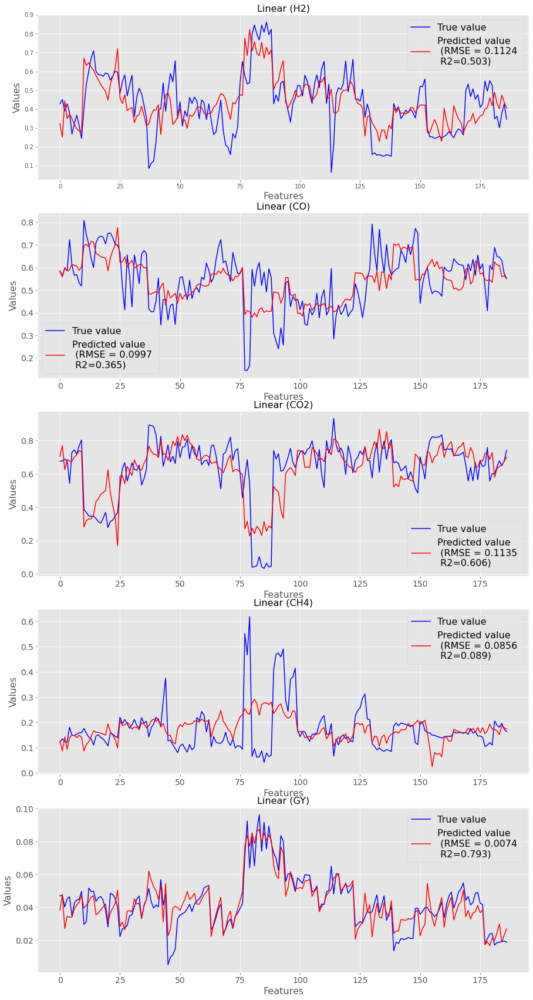

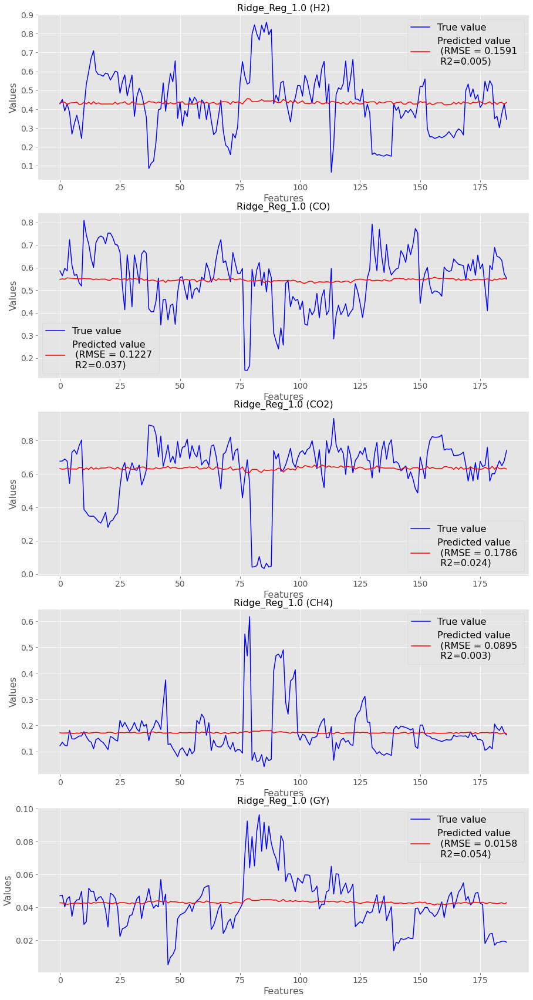

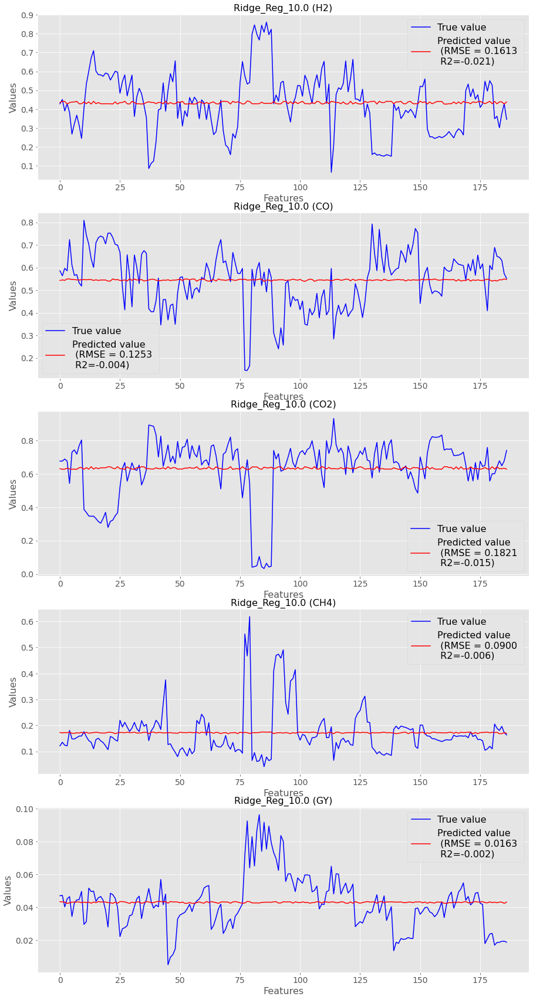

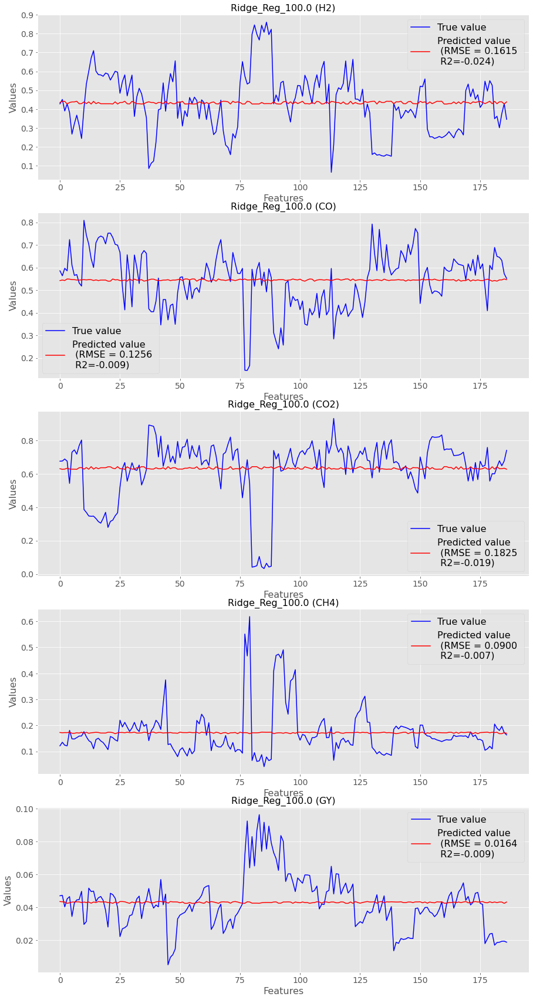

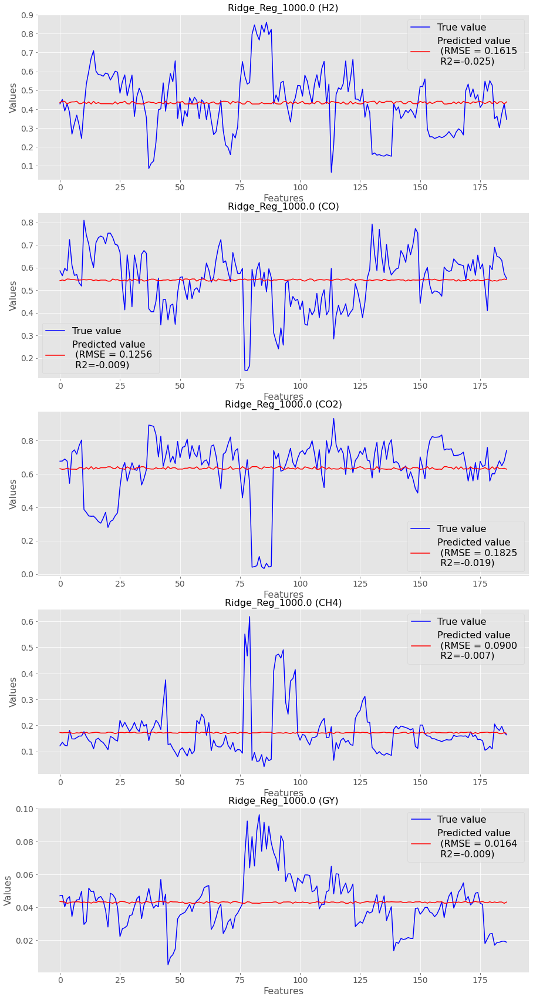

...

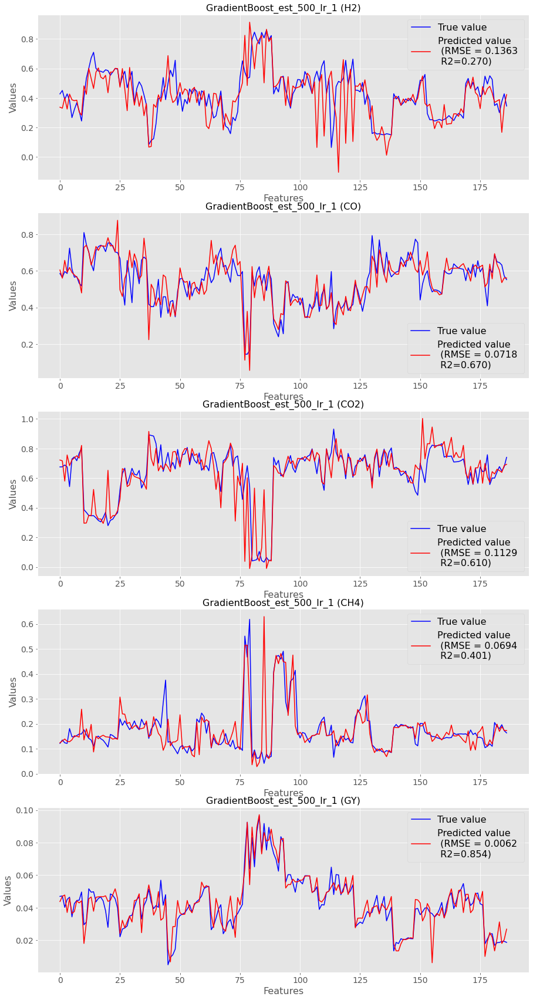

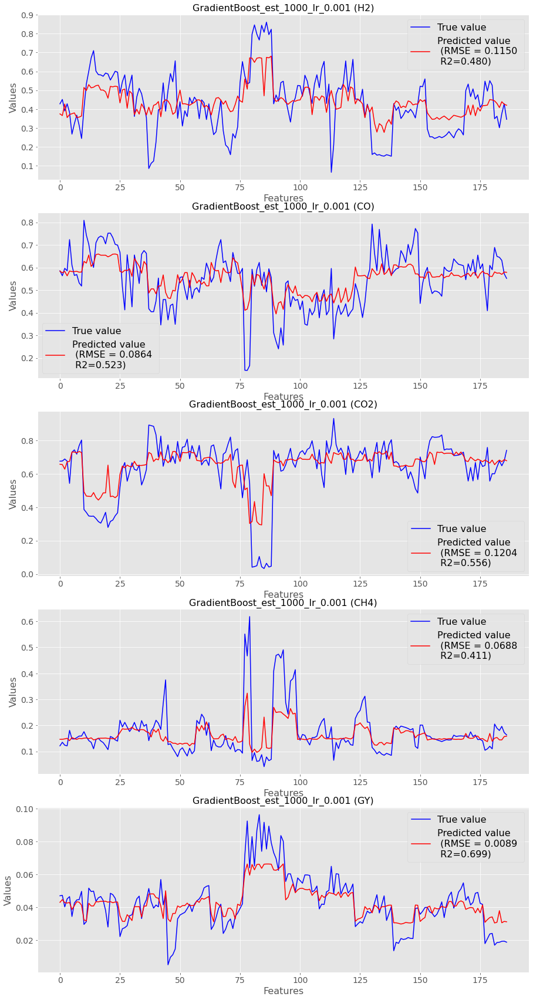

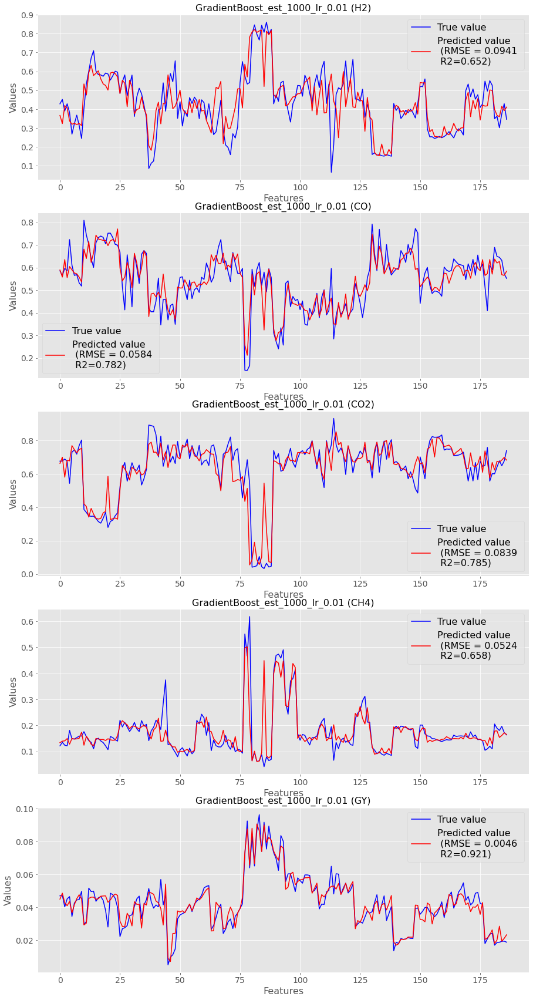

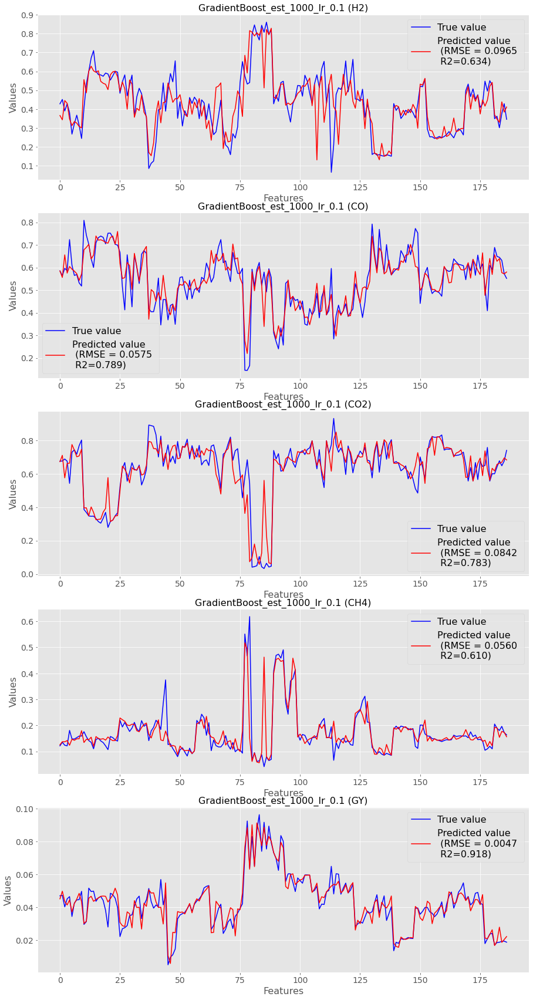

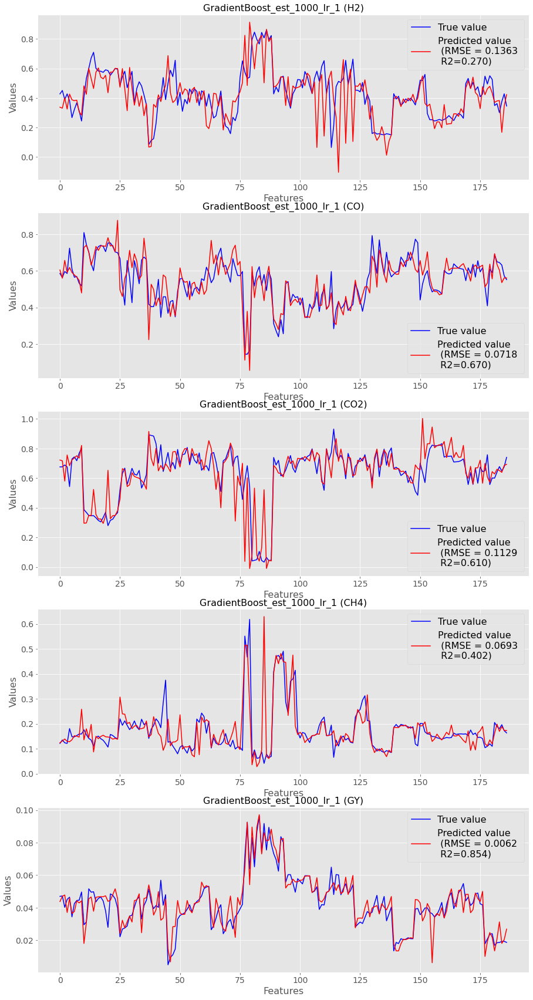

In [7]:
### Plot
for met in methods_extended:
    plt.figure(figsize=(15, 30))
    for odx, out in enumerate(output_columns):
        plt.subplot(5, 1, odx +1)
        plt.plot(np.asarray(ynorm)[:, odx], label='True value', color='blue')
        plt.plot(np.asarray(prediction[met])[:, odx], color='red', 
                 label='Predicted value \n (RMSE = %.4f \n R2=%.3f)' % (error[met][odx], (r2value[met][odx])))
        plt.xlabel("Features", fontsize=16)
        plt.ylabel("Values", fontsize=16)
        plt.rc('xtick',labelsize=14)
        plt.rc('ytick',labelsize=14)
        plt.title("%s (%s)" % (met, out), fontsize=16)
        plt.legend(fontsize=16)

    plt.savefig('Figures/MISO/Prediction_%s.pdf' % met)
#     plt.show()

## Feature Importance from the best method

['ER', 'Bed material', 'O', 'Steam/Biomass', 'T', 'C', 'H', 'Ash', 'Moisture']
Feature ranking:
1. feature 5 (0.319915)
2. feature 7 (0.147935)
3. feature 2 (0.146269)
4. feature 8 (0.117997)
5. feature 6 (0.079571)
6. feature 0 (0.059740)
7. feature 1 (0.048053)
8. feature 4 (0.046363)
9. feature 3 (0.034156)
['O', 'Ash', 'Bed material', 'ER', 'T', 'C', 'H', 'Moisture', 'Steam/Biomass']
Feature ranking:
1. feature 2 (0.454349)
2. feature 4 (0.148941)
3. feature 7 (0.141227)
4. feature 5 (0.058278)
5. feature 6 (0.053127)
6. feature 0 (0.043370)
7. feature 1 (0.040767)
8. feature 3 (0.034393)
9. feature 8 (0.025549)
['Ash', 'Steam/Biomass', 'H', 'ER', 'C', 'Bed material', 'T', 'Moisture', 'O']
Feature ranking:
1. feature 4 (0.267776)
2. feature 8 (0.191712)
3. feature 1 (0.143241)
4. feature 5 (0.130212)
5. feature 0 (0.105869)
6. feature 7 (0.050965)
7. feature 6 (0.043354)
8. feature 3 (0.033884)
9. feature 2 (0.032986)
['Bed material', 'Moisture', 'Ash', 'C', 'H', 'ER', 'O', 'T', 'S

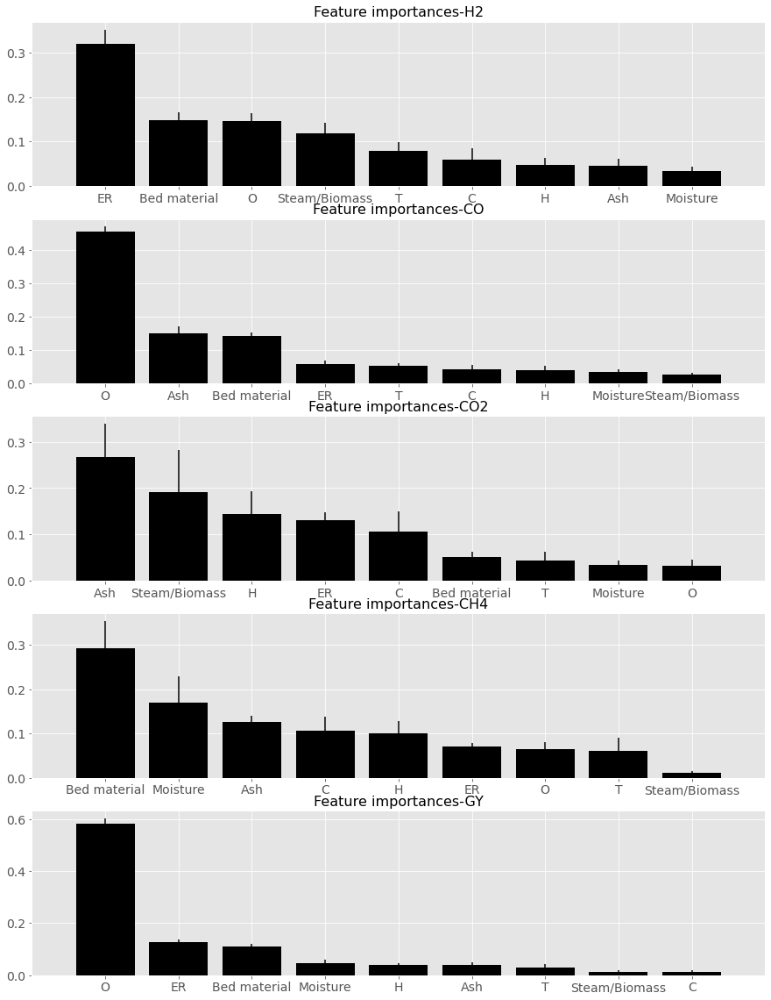

In [26]:
importances={}
std = {}
indices = {}
plt.figure(figsize=(15, 20))
for idx in range(y.shape[1]):
    importances[idx]=[]
    std[idx]=[]
    for fold, (train, test) in enumerate(kf.split(ynorm)):
        training_x = np.asarray(Xnorm)[train]
        testing_x = np.asarray(Xnorm)[test]
        training_y = np.asarray(ynorm)[train, idx]
        testing_y = np.asarray(ynorm)[test, idx]
        
        regr = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.1, random_state=0, loss='huber')
        regr.fit(training_x, training_y)
        
        importances[idx].append(regr.feature_importances_)
    mean_importance = np.array(importances[idx]).mean(axis=0)
    std_importance = np.array(importances[idx]).std(axis=0)
        
    indices[idx] = np.argsort(mean_importance)[::-1]
    label_index = [input_columns[j] for j in indices[idx]]
    print(label_index)
    
    # Print the feature ranking
    features=[]
    print("Feature ranking:")
    for f in range(X.shape[1]):
        print("%d. feature %d (%f)" % (f + 1, indices[idx][f], mean_importance[indices[idx][f]]))
        features.append(input_columns[indices[idx][f]])

    # Plot the impurity-based feature importances
    plt.subplot(5, 1, idx +1)
    plt.title("Feature importances-%s" % output_columns[idx], fontsize=16)
    plt.bar(range(Xnorm.shape[1]), mean_importance[indices[idx]],
            color="k", yerr=std_importance[indices[idx]], align="center")
    plt.xticks(range(Xnorm.shape[1]), label_index, fontsize=14)
    plt.rc('ytick',labelsize=14)
    plt.xlim([-1, Xnorm.shape[1]])
    #plt.savefig('Figures/MISO/Feature_Importance_'+ str(idx) +'.pdf')
plt.savefig('Figures/MISO/Feature_Importance.pdf')

## Correlation Analysis

5
2
4
7
2


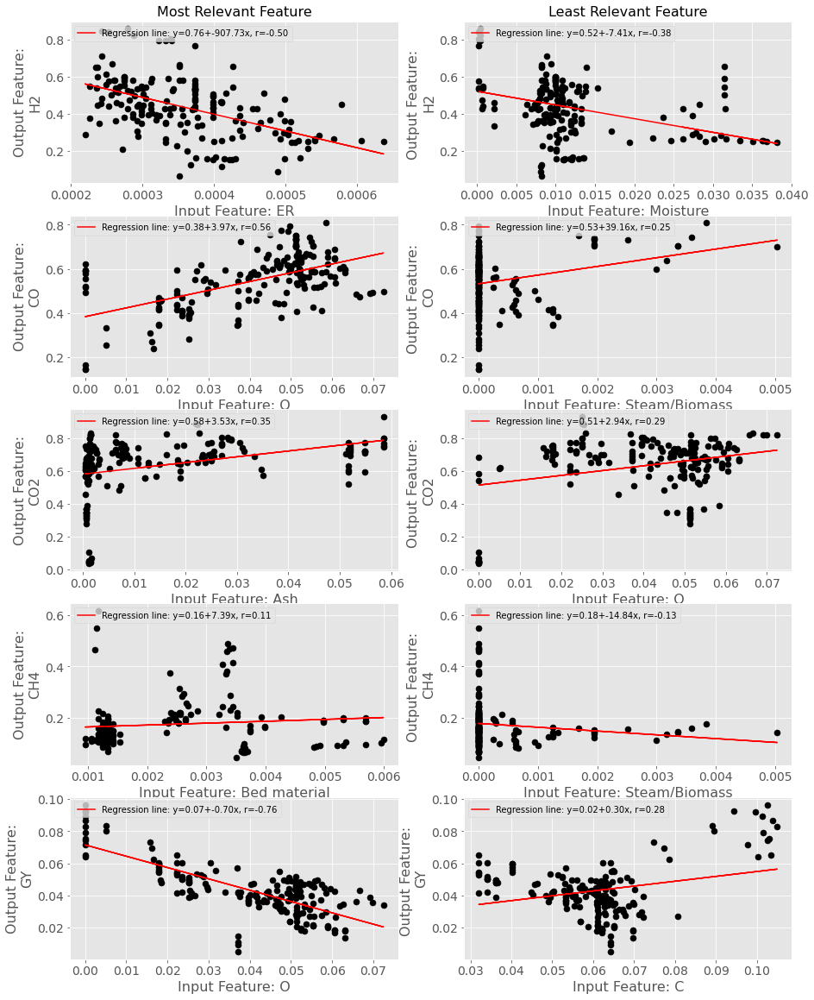

In [22]:
## Correlation analysis for best feature
plt.figure(figsize=(15, 20))
for odx, out in enumerate(output_columns):
    best_feature_indice = indices[odx][0]
    print(best_feature_indice)
    plt.subplot(5, 2, 2*odx +1)
    plt.scatter(Xnorm[:, best_feature_indice], ynorm[:, odx], s=50, color='black')
    slope, intercept, r, p, stderr = sp.stats.linregress(Xnorm[:, best_feature_indice].astype(float), 
                                                         ynorm[:, odx].astype(float))
    line = f'Regression line: y={intercept:.2f}+{slope:.2f}x, r={r:.2f}'
    plt.plot(Xnorm[:, best_feature_indice], intercept + slope * Xnorm[:, best_feature_indice], 
             label=line, color='red')
    plt.xlabel("Input Feature: %s" % input_columns[best_feature_indice], fontsize=16)
    plt.ylabel("Output Feature:\n%s" % out, fontsize=16)
    if odx==0:
        plt.title("Most Relevant Feature", fontsize=16)
    plt.legend(loc='upper left')
    
    plt.subplot(5, 2, 2*odx +2)
    worst_feature_indice = indices[odx][-1]   
    plt.scatter(Xnorm[:, worst_feature_indice], ynorm[:, odx], s=50, color='black')
    slope, intercept, r, p, stderr = sp.stats.linregress(Xnorm[:, worst_feature_indice].astype(float), 
                                                         ynorm[:, odx].astype(float))
    line = f'Regression line: y={intercept:.2f}+{slope:.2f}x, r={r:.2f}'
    plt.plot(Xnorm[:, worst_feature_indice], intercept + slope * Xnorm[:, worst_feature_indice], 
             label=line, color='red')
    plt.xlabel("Input Feature: %s" % input_columns[worst_feature_indice],fontsize=16)
    plt.ylabel("Output Feature: \n%s" % out, fontsize=16)
    if odx == 0:
        plt.title("Least Relevant Feature", fontsize=16)
    plt.legend(loc='upper left')
plt.savefig('Figures/MISO/Correlation_analysis.pdf')